In [2]:
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import random
import math
import time
from itertools import product

from shapely.geometry import Polygon, box
from ultralytics import YOLO
from glob import glob
from sklearn.cluster import DBSCAN

In [44]:
# data_dir = glob('C:/Users/ghkdr/Desktop/성현폴더/충북대/논문/데이터/혼합검증용/data/*/*.jpg')
image_dir = r'C:\Users\ghkdr\Desktop\성현폴더\충북대\논문\데이터\크기편차검증용\대\batch_103_save_images_0575723.jpg'
model_dir = r'C:\Users\ghkdr\Desktop\성현폴더\충북대\논문\실험\runs\yolov9c_aug\train2\weights\best.pt'
model = YOLO(model_dir)

In [45]:
image = cv2.imread(image_dir)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image_to_save = image.copy()
cv2.rectangle(image_to_save, (5, 5), (950, 955), (255, 255, 255), 3)
results = model(image, conf=0.01, iou=0.6, verbose=False, save=False)

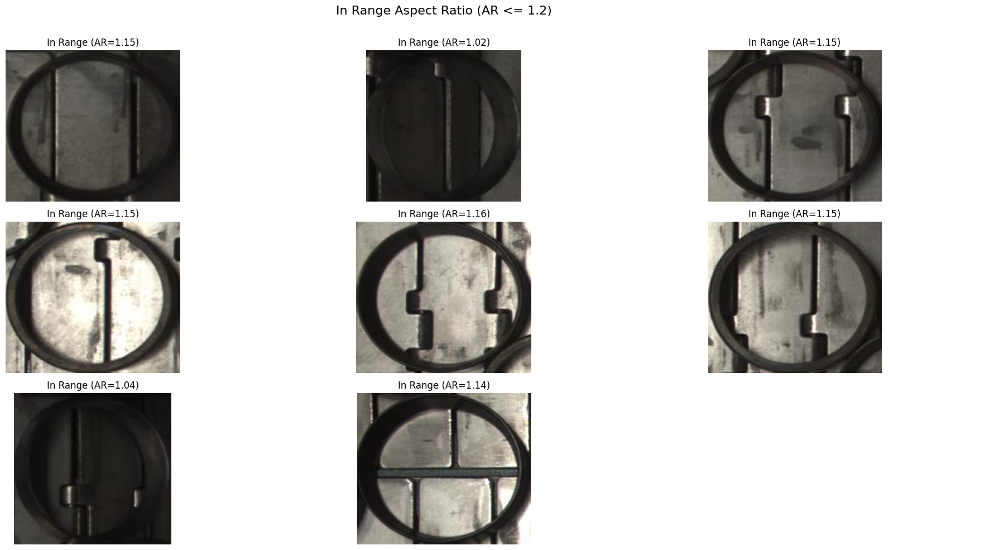

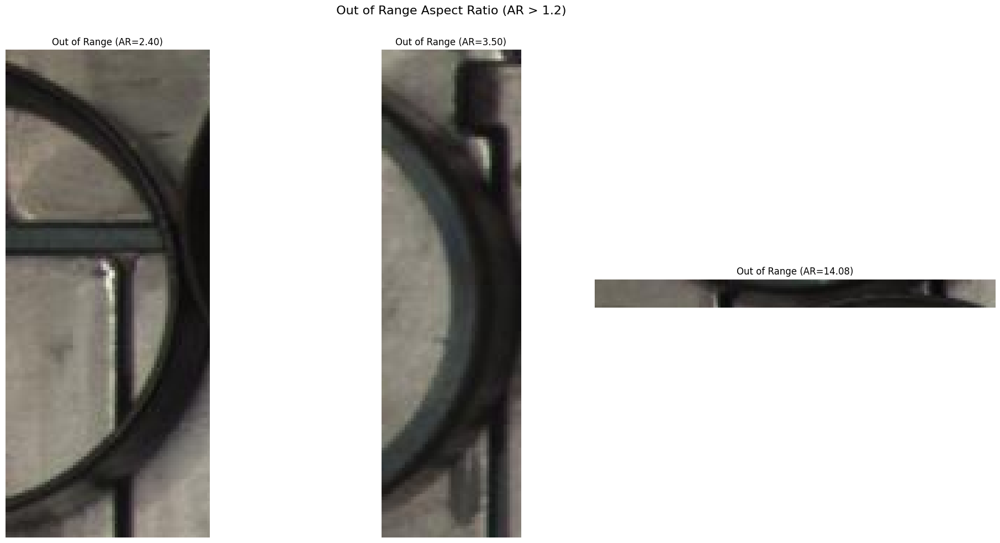

In [46]:
# aspect_ratio_max가 특정 범위에 있는 경우와 그렇지 않은 경우를 구분하기 위한 리스트 정의
in_range_images = []
in_range_ratios = []
out_of_range_images = []
out_of_range_ratios = []

# 결과 처리
for result in results:
    for i, (x, y, w, h) in enumerate(result.boxes.xywh.cpu().numpy()):
        # 좌표를 정수로 변환
        x, y, w, h = map(int, [x, y, w, h])
        
        # 가로세로 비율 계산
        aspect_ratio_max = max(w / h, h / w)
        
        # xywh를 xyxy로 변환
        x1, y1 = x - w // 2, y - h // 2
        x2, y2 = x1 + w, y1 + h
        
        # 이미지 크롭
        cropped_image = image_rgb[y1:y2, x1:x2]
        
        # 비율에 따라 이미지를 리스트에 추가
        if aspect_ratio_max <= 1.2:
            in_range_images.append(cropped_image)
            in_range_ratios.append(aspect_ratio_max)
        else:
            out_of_range_images.append(cropped_image)
            out_of_range_ratios.append(aspect_ratio_max)

# In Range 이미지 플롯으로 결과 표시
num_in_range = len(in_range_images)
num_cols = 3
num_rows = math.ceil(num_in_range / num_cols)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 10))
fig.suptitle('In Range Aspect Ratio (AR <= 1.2)', fontsize=16)
axes = axes.flatten()

for i, (img, ratio) in enumerate(zip(in_range_images, in_range_ratios)):
    axes[i].imshow(img)
    axes[i].set_title(f'In Range (AR={ratio:.2f})')
    axes[i].axis('off')

# 남은 빈 플롯 숨기기
for i in range(num_in_range, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.show()

# Out of Range 이미지 플롯으로 결과 표시
num_out_of_range = len(out_of_range_images)
num_rows = math.ceil(num_out_of_range / num_cols)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 10))
fig.suptitle('Out of Range Aspect Ratio (AR > 1.2)', fontsize=16)
axes = axes.flatten()

for i, (img, ratio) in enumerate(zip(out_of_range_images, out_of_range_ratios)):
    axes[i].imshow(img)
    axes[i].set_title(f'Out of Range (AR={ratio:.2f})')
    axes[i].axis('off')

# 남은 빈 플롯 숨기기
for i in range(num_out_of_range, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.show()

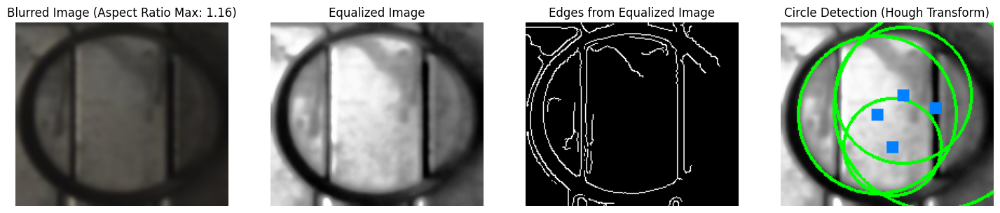

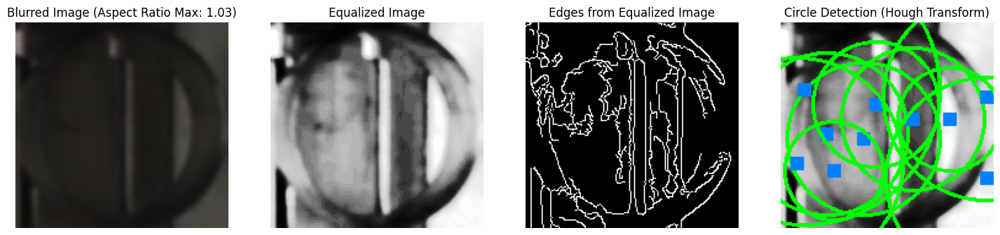

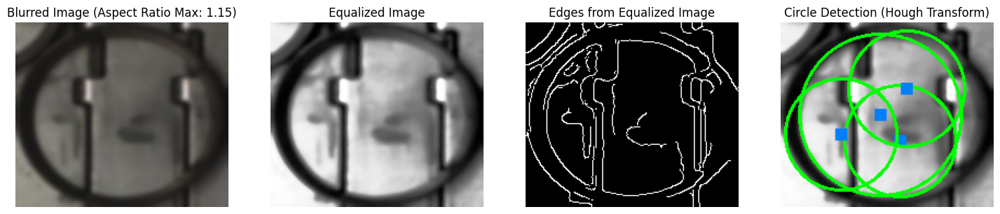

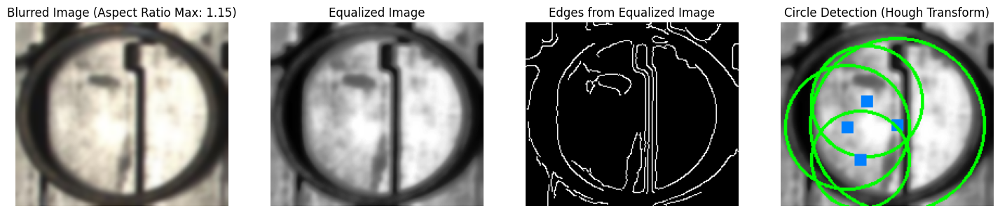

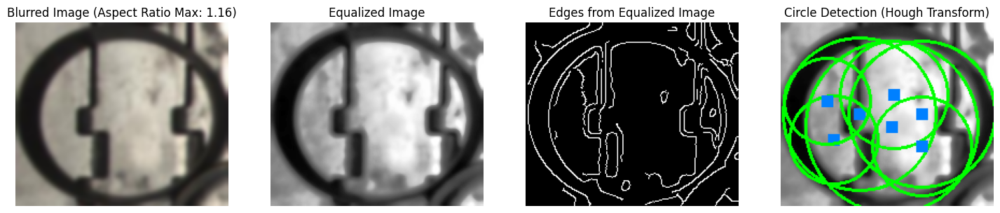

...

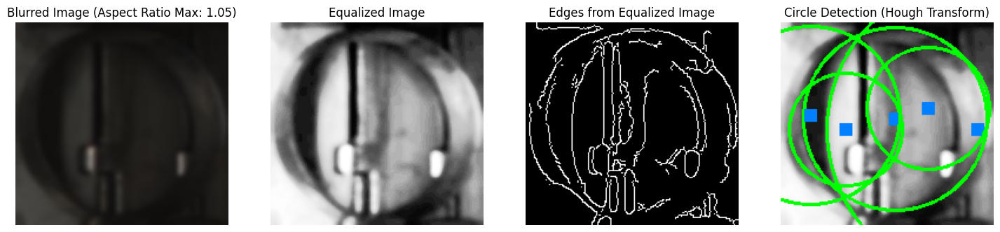

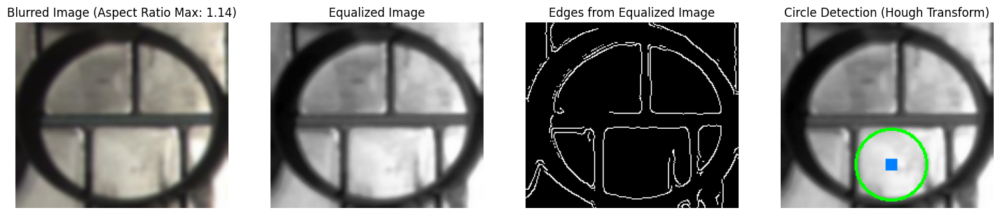

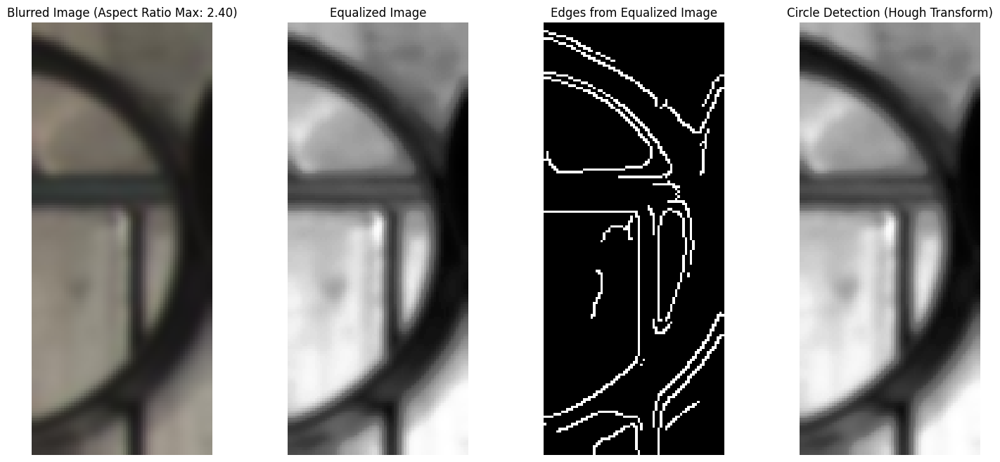

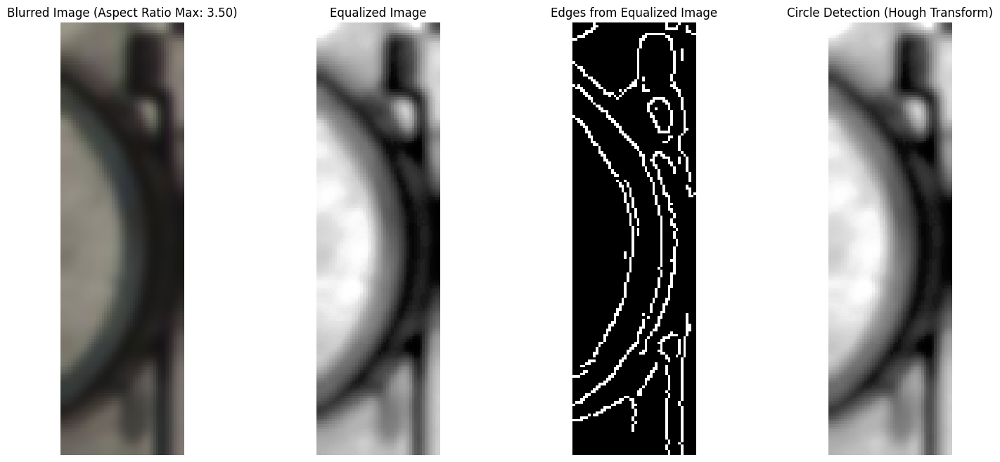

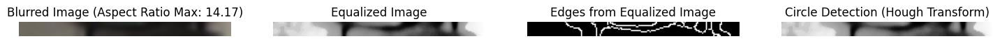

In [51]:
# aspect_ratio_max가 특정 범위에 있는 경우와 그렇지 않은 경우를 구분하기 위한 리스트 정의
in_range_images = []
in_range_ratios = []
out_of_range_images = []
out_of_range_ratios = []

# 결과 처리
for result in results:
    for i, (x1, y1, x2, y2) in enumerate(result.boxes.xyxy.cpu().numpy()):
        # 좌표를 정수로 변환
        x1, y1, x2, y2 = map(int, [x1, y1, x2, y2])
        
        # 이미지 크롭
        cropped_image = image_rgb[y1:y2, x1:x2]
        
        # 가로세로 비율 계산
        aspect_ratio_max = max((x2 - x1) / (y2 - y1), (y2 - y1) / (x2 - x1))
        
        # 가우시안 블러 적용
        blurred_image = cv2.GaussianBlur(cropped_image, (11, 11), 0)
        
        # 히스토그램 평탄화 적용
        cropped_image_gray = cv2.cvtColor(blurred_image, cv2.COLOR_RGB2GRAY)
        equalized_image = cv2.equalizeHist(cropped_image_gray)
        
        # 엣지 검출
        edges = cv2.Canny(equalized_image, 50, 150)
        
        # 허프 원 변환을 사용한 원 검출
        circles = cv2.HoughCircles(edges, cv2.HOUGH_GRADIENT, dp=1.2, minDist=30, param1=130, param2=60, minRadius=30, maxRadius=5000)
        contour_image = cv2.cvtColor(equalized_image, cv2.COLOR_GRAY2BGR)

        if circles is not None:
            circles = np.round(circles[0, :]).astype("int")
            for (cx, cy, r) in circles:
                # 원형으로 판단된 원 그리기
                cv2.circle(contour_image, (cx, cy), r, (0, 255, 0), 2)
                cv2.rectangle(contour_image, (cx - 5, cy - 5), (cx + 5, cy + 5), (0, 128, 255), -1)

        # 크롭된 이미지와 히스토그램 비교
        plt.figure(figsize=(18, 8))
        
        # 가우시안 블러 적용된 원본 이미지
        plt.subplot(1, 4, 1)
        plt.imshow(blurred_image)
        plt.title(f'Blurred Image (Aspect Ratio Max: {aspect_ratio_max:.2f})')
        plt.axis('off')
        
        # 히스토그램 평탄화된 이미지
        plt.subplot(1, 4, 2)
        plt.imshow(equalized_image, cmap='gray')
        plt.title('Equalized Image')
        plt.axis('off')
        
        # 엣지 검출 이미지
        plt.subplot(1, 4, 3)
        plt.imshow(edges, cmap='gray')
        plt.title('Edges from Equalized Image')
        plt.axis('off')
        
        # 원형으로 판단된 원 이미지
        plt.subplot(1, 4, 4)
        plt.imshow(contour_image)
        plt.title('Circle Detection (Hough Transform)')
        plt.axis('off')
        
        plt.show()

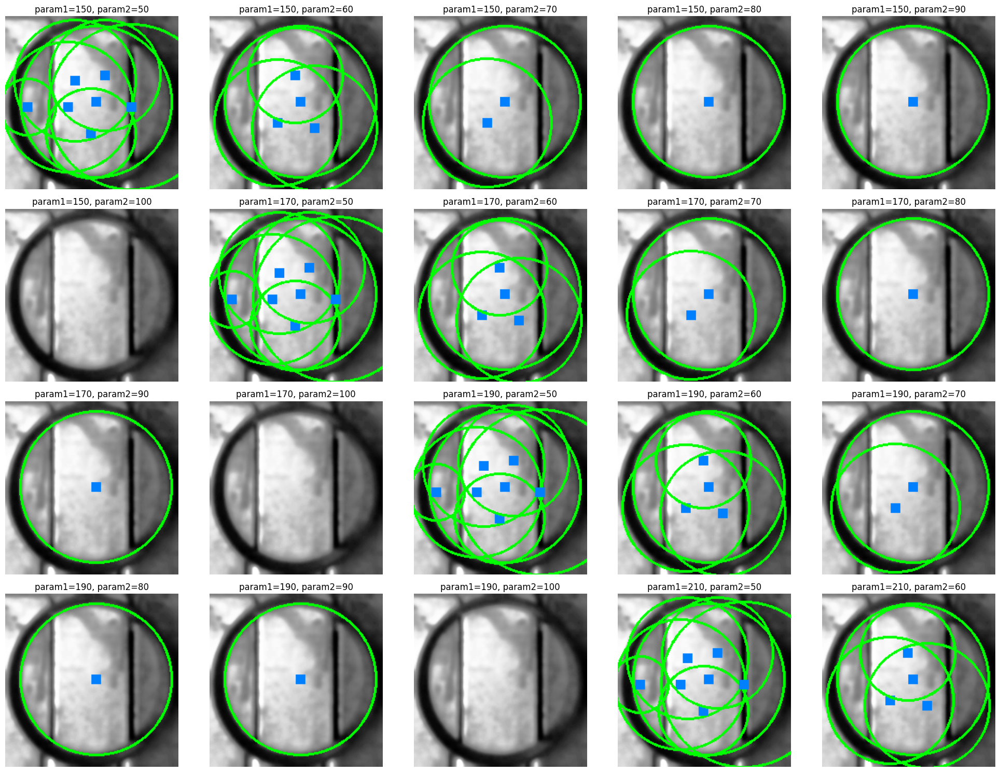

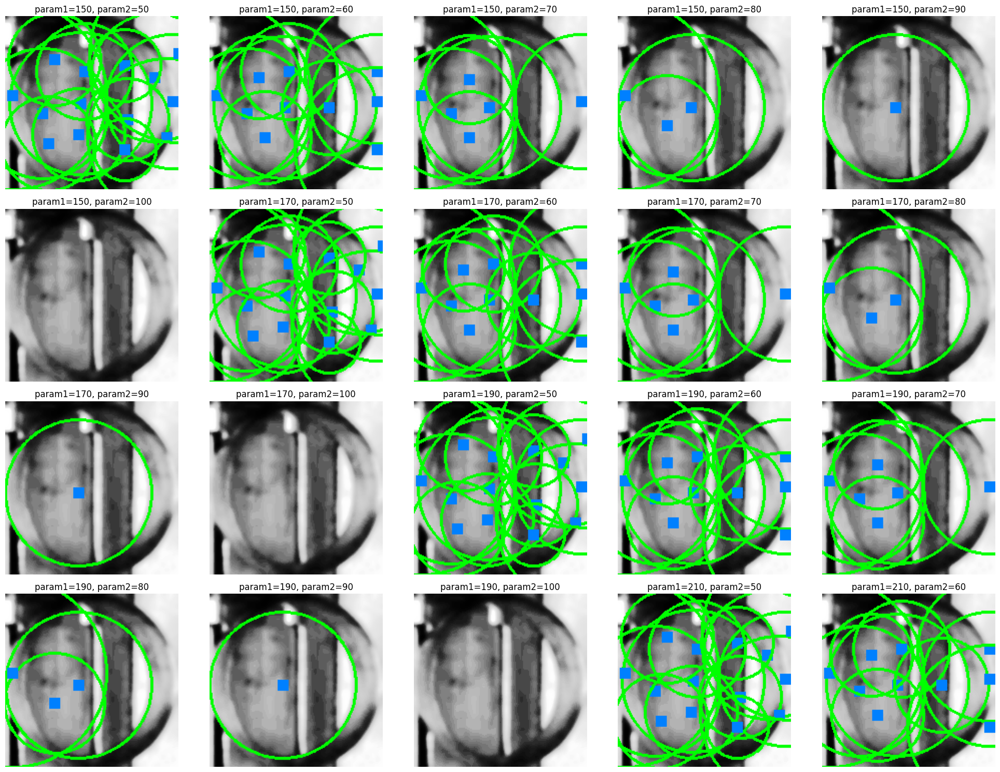

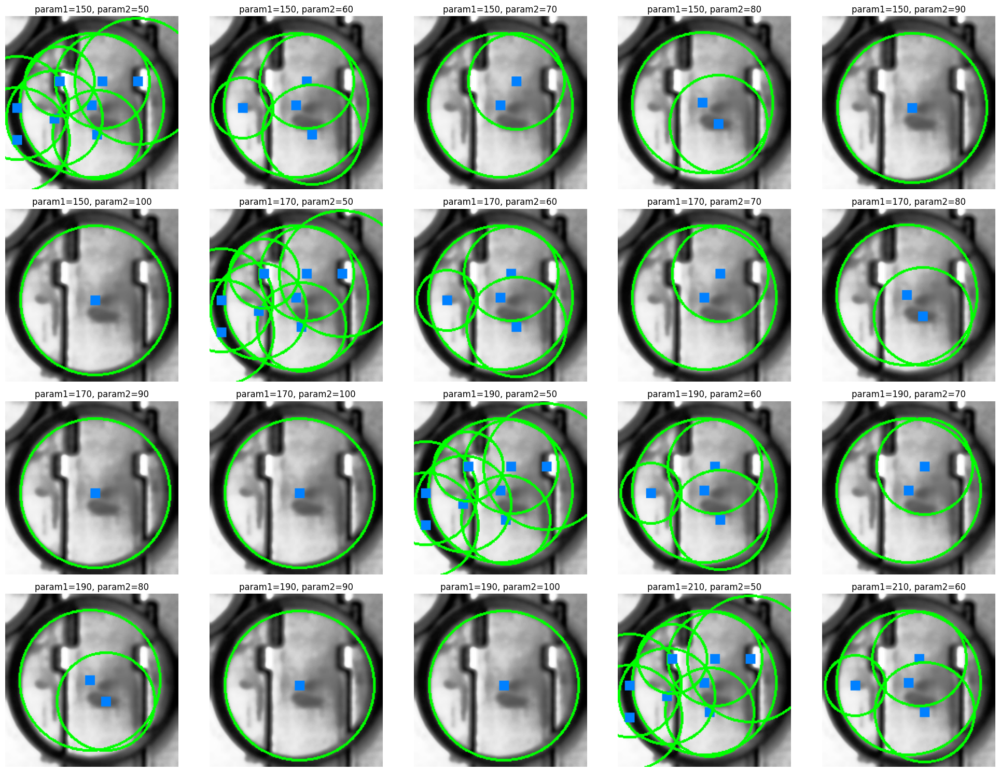

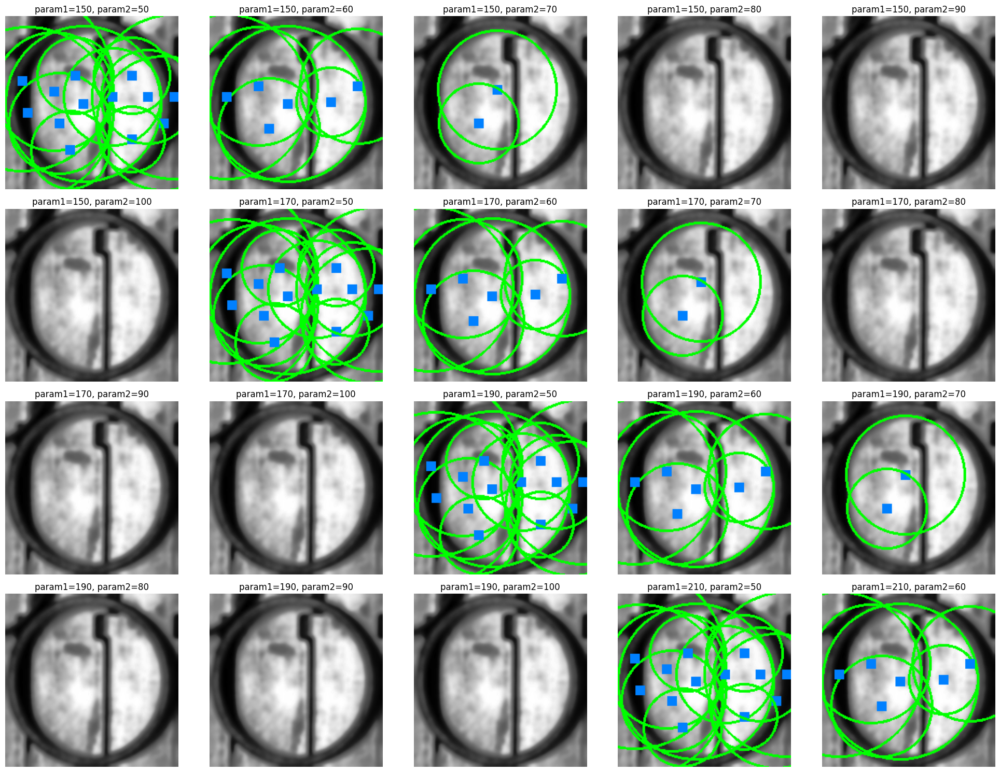

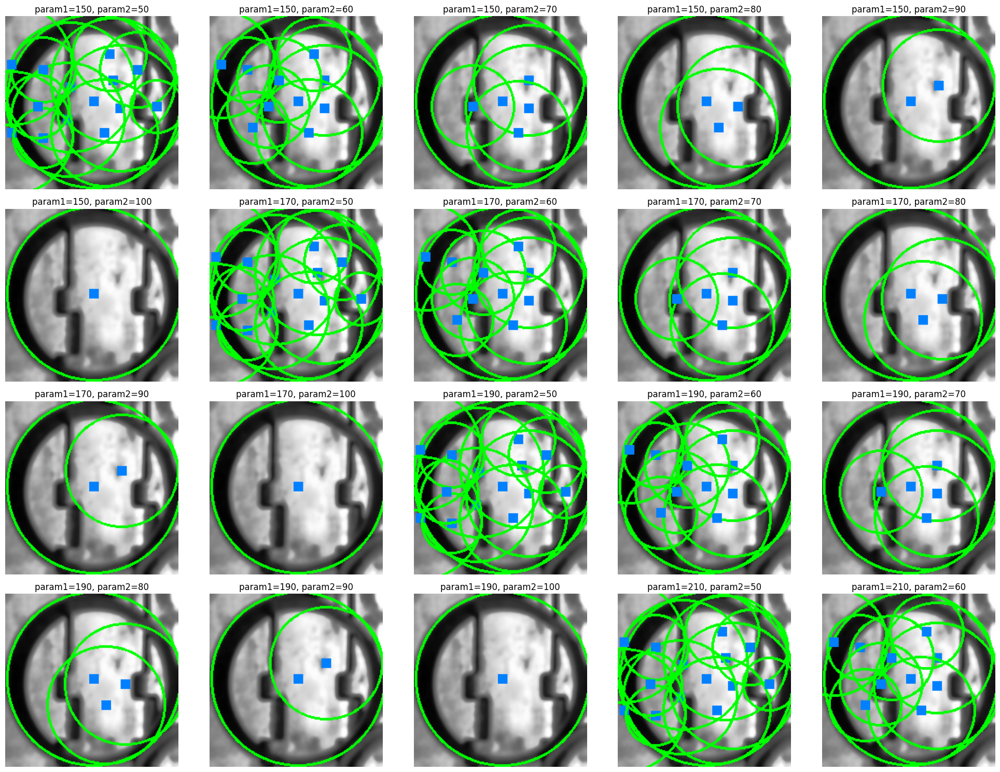

...

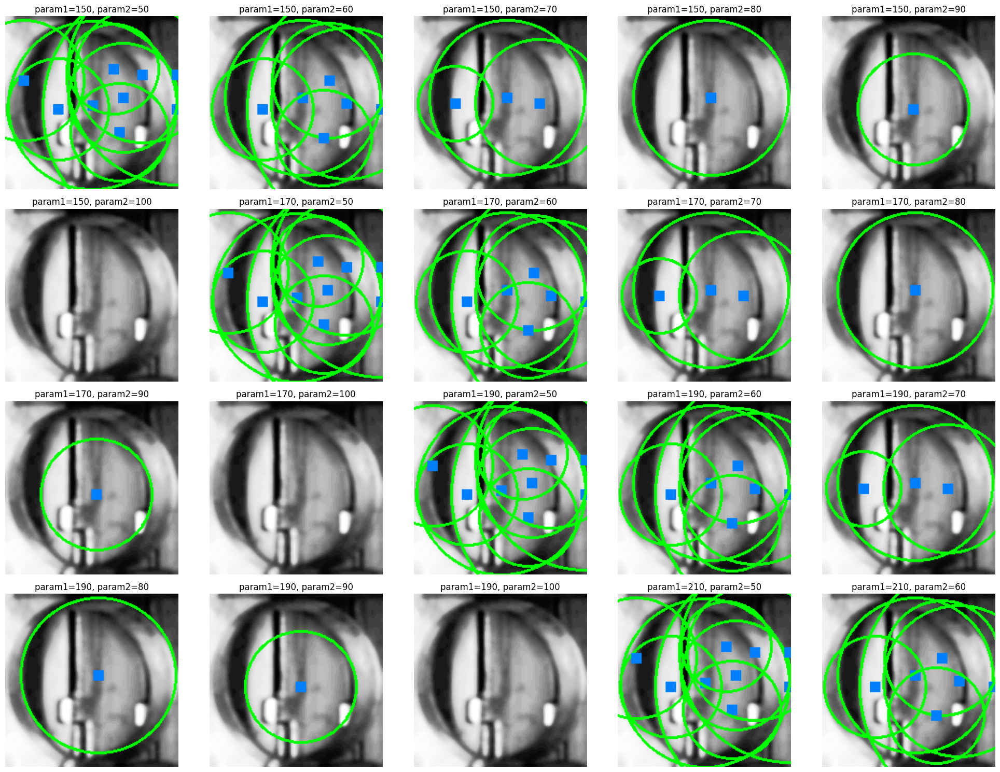

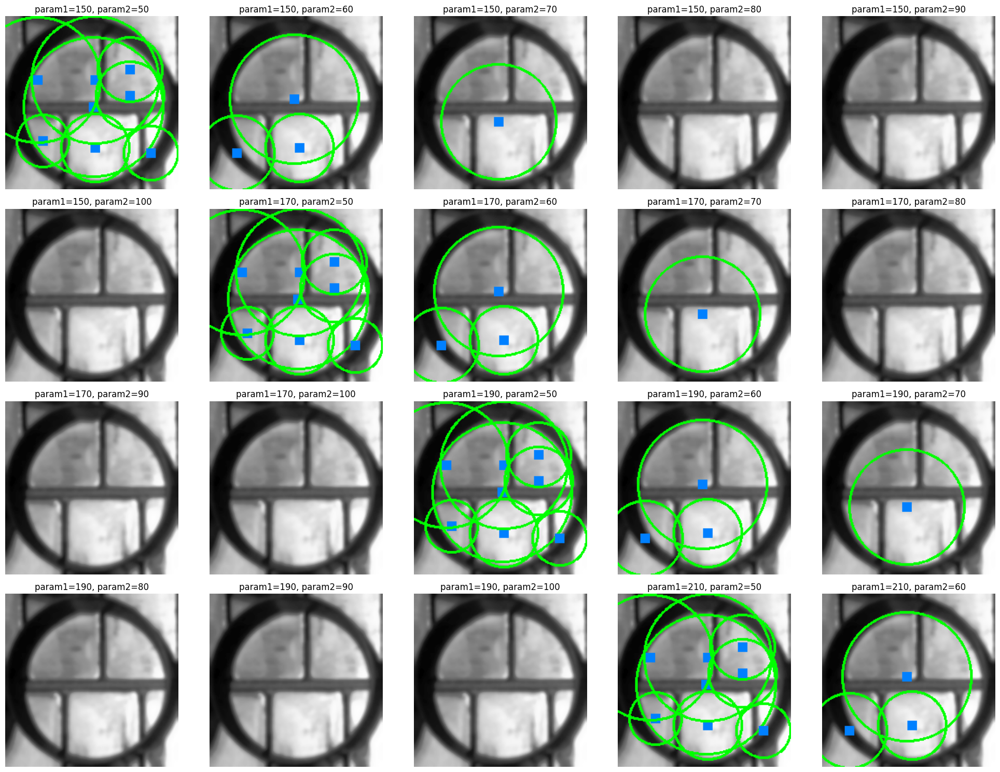

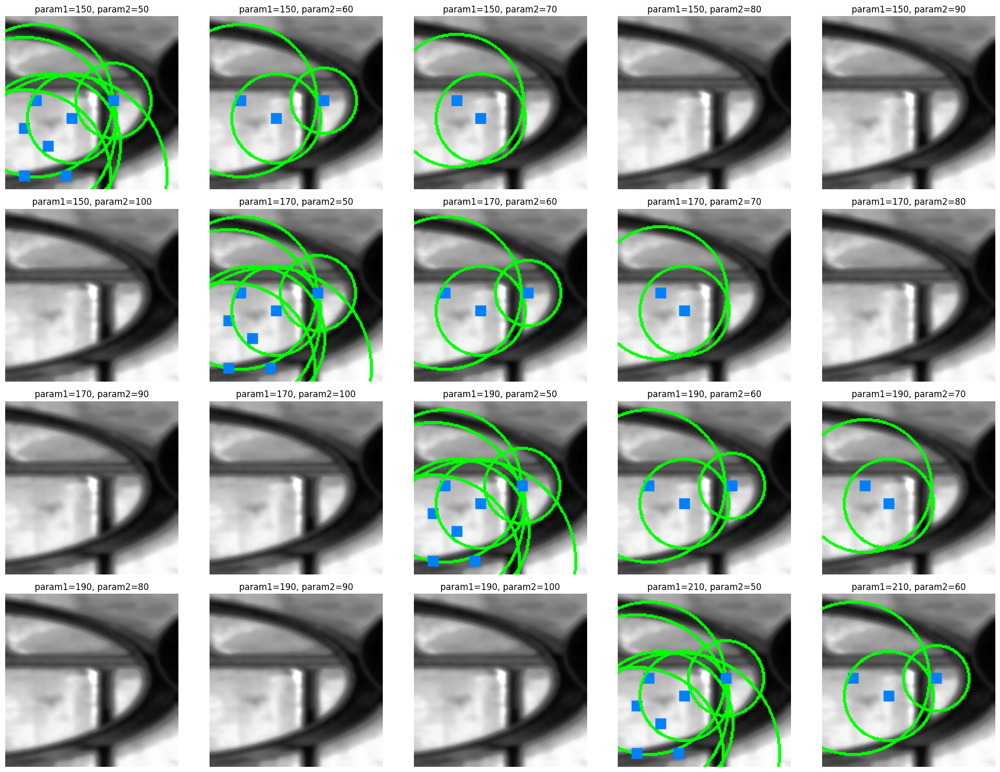

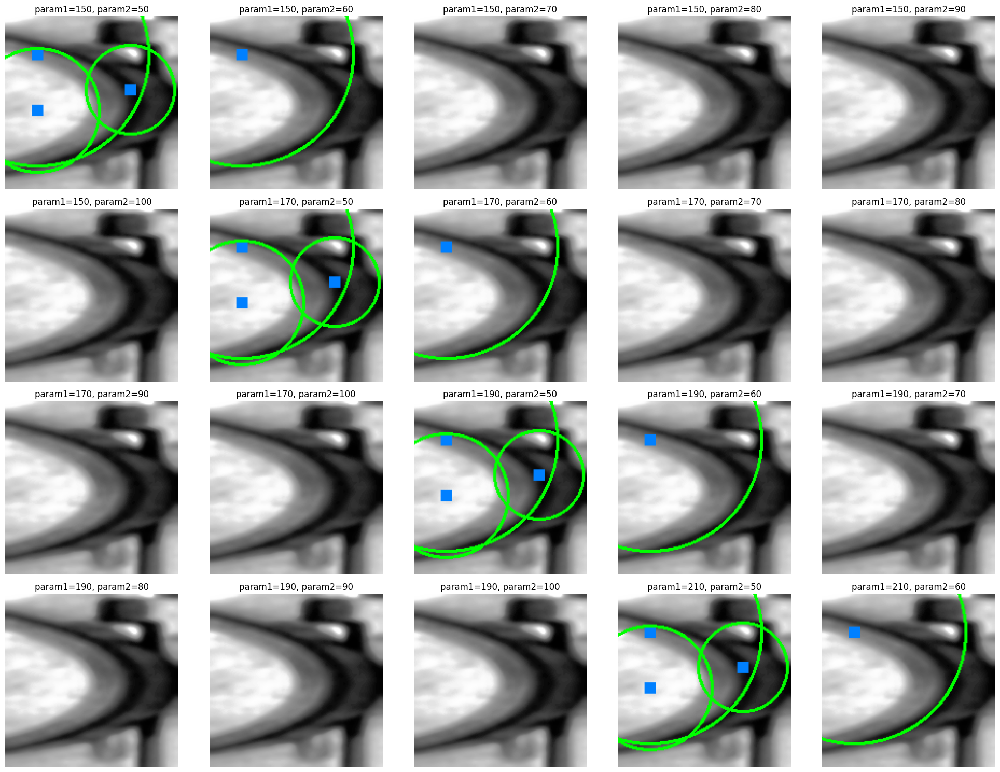

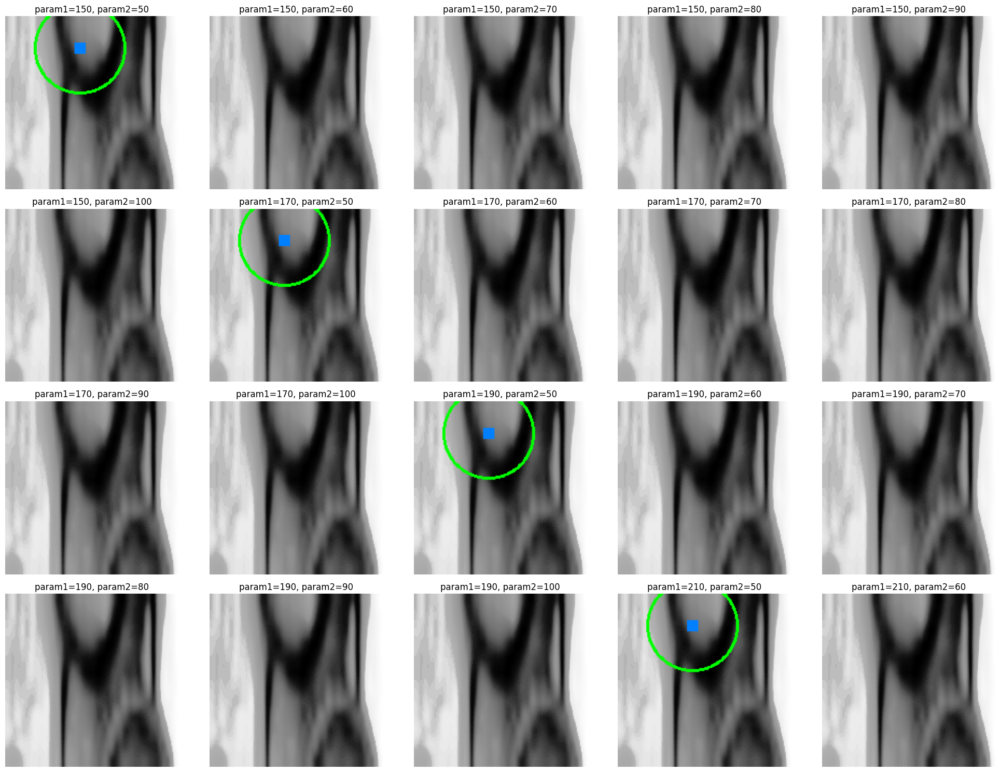

In [57]:
# 허프 원 변환을 위한 파라미터 조합 생성 (Grid Search)
dp_values = [1.2]
minDist_values = [30]
param1_values = [150, 170, 190, 210]
param2_values = [50, 60, 70, 80, 90, 100]
minRadius_values = [20]
maxRadius_values = [500]

param_combinations = list(product(dp_values, minDist_values, param1_values, param2_values, minRadius_values, maxRadius_values))

# 결과 처리
for result in results:
    for i, (x1, y1, x2, y2) in enumerate(result.boxes.xyxy.cpu().numpy()):
        # 좌표를 정수로 변환
        x1, y1, x2, y2 = map(int, [x1, y1, x2, y2])

        resize_factor = int(max((x2 - x1) , (y2 - y1)))
    
        # 이미지 크롭
        cropped_image = image_rgb[y1:y2, x1:x2]
        cropped_image = cv2.resize(cropped_image, (resize_factor, resize_factor))
        
        # 가우시안 블러 적용
        blurred_image = cv2.GaussianBlur(cropped_image, (11, 11), 0)
        
        # 히스토그램 평탄화 적용
        cropped_image_gray = cv2.cvtColor(blurred_image, cv2.COLOR_RGB2GRAY)
        equalized_image = cv2.equalizeHist(cropped_image_gray)
        
        # 엣지 검출
        edges = cv2.Canny(equalized_image, 50, 150)
        
        # 허프 원 변환을 사용한 원 검출 (Grid Search 적용)
        fig, axes = plt.subplots(4, 5, figsize=(20, 15))
        axes = axes.flatten()

        for idx, (dp, minDist, param1, param2, minRadius, maxRadius) in enumerate(param_combinations):
            if idx >= len(axes):
                break
            circles = cv2.HoughCircles(edges, cv2.HOUGH_GRADIENT, dp=dp, minDist=minDist, param1=param1, param2=param2, minRadius=minRadius, maxRadius=maxRadius)
            contour_image = cv2.cvtColor(equalized_image, cv2.COLOR_GRAY2BGR)

            if circles is not None:
                circles = np.round(circles[0, :]).astype("int")
                for (cx, cy, r) in circles:
                    # 원형으로 판단된 원 그리기
                    cv2.circle(contour_image, (cx, cy), r, (0, 255, 0), 2)
                    cv2.rectangle(contour_image, (cx - 5, cy - 5), (cx + 5, cy + 5), (0, 128, 255), -1)

            # 원 검출 결과 표시
            axes[idx].imshow(contour_image)
            axes[idx].set_title(f'param1={param1}, param2={param2}')
            axes[idx].axis('off')

        # 남은 빈 플롯 숨기기
        for idx in range(len(param_combinations), len(axes)):
            axes[idx].axis('off')

        plt.tight_layout()
        plt.show()

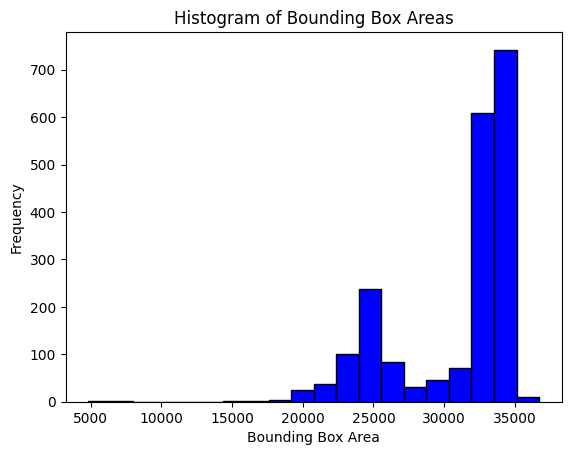

In [3]:
import matplotlib.pyplot as plt
from ultralytics import YOLO

# 모델 로드
image_dir = r'C:\Users\ghkdr\Desktop\성현폴더\충북대\논문\데이터\크기편차검증용\대'
model_dir = r'C:\Users\ghkdr\Desktop\성현폴더\충북대\논문\실험\runs\yolov9c_aug\train2\weights\best.pt'

# 이미지 예측
model = YOLO(model_dir)
results = model(image_dir, conf=0.8, iou=0.6, verbose=False, save=False)

# 각 박스의 면적을 계산하여 리스트에 저장
areas = []
for result in results:
    for i, (x, y, w, h) in enumerate(result.boxes.xywh.cpu().numpy()):
        # 좌표를 정수로 변환
        x, y, w, h = map(int, [x, y, w, h])
        
        # 가로세로 비율 계산
        aspect_ratio_max = max(w / h, h / w)
        
        # xywh를 xyxy로 변환
        x1, y1 = x - w // 2, y - h // 2
        x2, y2 = x1 + w, y1 + h
        
        # 비율에 따라 이미지를 리스트에 추가
        if aspect_ratio_max <= 1.2:
            area = w * h
            areas.append(area)

# 히스토그램 출력
plt.hist(areas, bins=20, color='blue', edgecolor='black')
plt.xlabel('Bounding Box Area')
plt.ylabel('Frequency')
plt.title('Histogram of Bounding Box Areas')
plt.show()

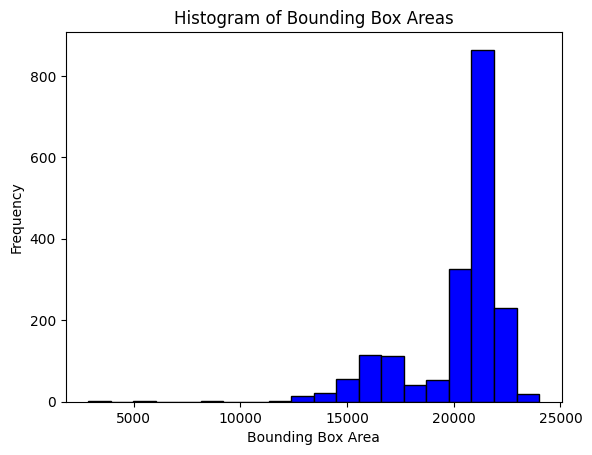

In [4]:
import matplotlib.pyplot as plt
from ultralytics import YOLO

# 모델 로드
image_dir = r'C:\Users\ghkdr\Desktop\성현폴더\충북대\논문\데이터\크기편차검증용\중'
model_dir = r'C:\Users\ghkdr\Desktop\성현폴더\충북대\논문\실험\runs\yolov9c_aug\train2\weights\best.pt'

# 이미지 예측
model = YOLO(model_dir)
results = model(image_dir, conf=0.8, iou=0.6, verbose=False, save=False)

# 각 박스의 면적을 계산하여 리스트에 저장
areas = []
for result in results:
    for i, (x, y, w, h) in enumerate(result.boxes.xywh.cpu().numpy()):
        # 좌표를 정수로 변환
        x, y, w, h = map(int, [x, y, w, h])
        
        # 가로세로 비율 계산
        aspect_ratio_max = max(w / h, h / w)
        
        # xywh를 xyxy로 변환
        x1, y1 = x - w // 2, y - h // 2
        x2, y2 = x1 + w, y1 + h
        
        # 비율에 따라 이미지를 리스트에 추가
        if aspect_ratio_max <= 1.2:
            area = w * h
            areas.append(area)

# 히스토그램 출력
plt.hist(areas, bins=20, color='blue', edgecolor='black')
plt.xlabel('Bounding Box Area')
plt.ylabel('Frequency')
plt.title('Histogram of Bounding Box Areas')
plt.show()

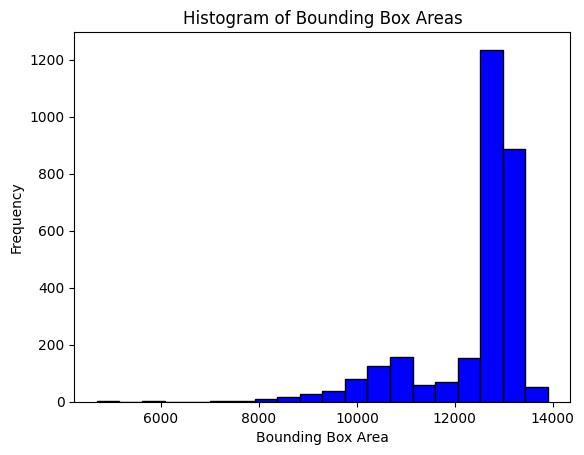

In [5]:
import matplotlib.pyplot as plt
from ultralytics import YOLO

# 모델 로드
image_dir = r'C:\Users\ghkdr\Desktop\성현폴더\충북대\논문\데이터\크기편차검증용\소'
model_dir = r'C:\Users\ghkdr\Desktop\성현폴더\충북대\논문\실험\runs\yolov9c_aug\train2\weights\best.pt'

# 이미지 예측
model = YOLO(model_dir)
results = model(image_dir, conf=0.8, iou=0.6, verbose=False, save=False)

# 각 박스의 면적을 계산하여 리스트에 저장
areas = []
for result in results:
    for i, (x, y, w, h) in enumerate(result.boxes.xywh.cpu().numpy()):
        # 좌표를 정수로 변환
        x, y, w, h = map(int, [x, y, w, h])
        
        # 가로세로 비율 계산
        aspect_ratio_max = max(w / h, h / w)
        
        # xywh를 xyxy로 변환
        x1, y1 = x - w // 2, y - h // 2
        x2, y2 = x1 + w, y1 + h
        
        # 비율에 따라 이미지를 리스트에 추가
        if aspect_ratio_max <= 1.2:
            area = w * h
            areas.append(area)

# 히스토그램 출력
plt.hist(areas, bins=20, color='blue', edgecolor='black')
plt.xlabel('Bounding Box Area')
plt.ylabel('Frequency')
plt.title('Histogram of Bounding Box Areas')
plt.show()

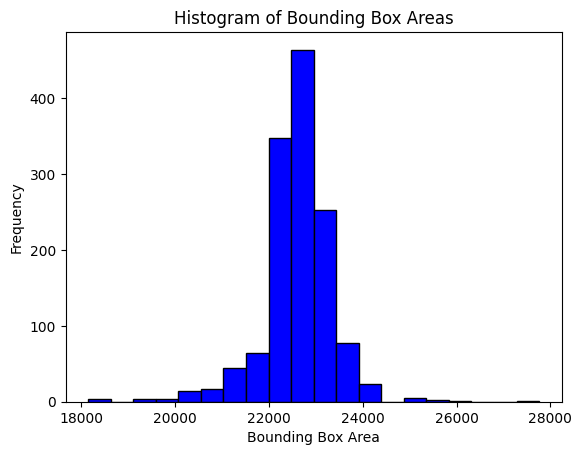

In [40]:
import matplotlib.pyplot as plt
from ultralytics import YOLO

# 모델 로드
image_dir = glob(r'C:\Users\ghkdr\Desktop\성현폴더\충북대\논문\데이터\크기편차검증용\data\대\*.jpg')
model_dir = r'C:\Users\ghkdr\Desktop\성현폴더\충북대\논문\실험\runs\yolov9c_aug\train2\weights\best.pt'

save_dir = f"result/output{len(glob('result/*'))}"
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

# 이미지 예측
model = YOLO(model_dir)
roi = box(5, 5, 950,955)
areas = []

for image_path in image_dir:
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image.copy(), cv2.COLOR_BGR2RGB)
    image_to_save = image.copy()
    cv2.rectangle(image_to_save, (5, 5), (950, 955), (255, 255, 255), 3)
    
    results = model(image, conf=0.8, iou=0.6, verbose=False, save=False)

    for result in results:
        for i, (x, y, w, h) in enumerate(result.boxes.xywh.cpu().numpy()):
            # 좌표를 정수로 변환
            x, y, w, h = map(int, [x, y, w, h])
            bbox = box(x - w / 2, y - h / 2, x + w / 2, y + h / 2)

            if roi.contains(bbox):
    
                # 가로세로 비율 계산
                aspect_ratio_max = max(w / h, h / w)
                   
                # 비율에 따라 이미지를 리스트에 추가
                if  1.0 <=aspect_ratio_max <= 1.2:
                    # area = w * h
                    # areas.append(area)
                
                    # xywh를 xyxy로 변환
                    x1, y1 = x - w // 2, y - h // 2
                    x2, y2 = x1 + w, y1 + h

                    resize_factor = int(min((x2 - x1) , (y2 - y1)))
                    # scale_factor = int(max((x2 - x1) , (y2 - y1))) / resize_factor
                      
                    # 이미지 크롭
                    cropped_image = image_rgb[y1:y2, x1:x2].copy()
                    # cropped_image = cv2.resize(cropped_image, (resize_factor, resize_factor))
            
                    # 가우시안 블러 적용
                    blurred_image = cv2.GaussianBlur(cropped_image, (11, 11), 0)
                
                    # 히스토그램 평탄화 적용
                    cropped_image_gray = cv2.cvtColor(blurred_image, cv2.COLOR_RGB2GRAY)
                    equalized_image = cv2.equalizeHist(cropped_image_gray)
                    
                    # 엣지 검출
                    edges = cv2.Canny(equalized_image, 50, 150)
        
                    # 허프 서클 탐지
                    circles = cv2.HoughCircles(edges, cv2.HOUGH_GRADIENT, dp=1, minDist=5, param1=50, param2=5, minRadius=5, maxRadius=500)
        
                    # 원이 검출되었을 때
                    if circles is not None:
                        circles = np.round(circles[0, :]).astype('int')
                        # bbox_area = w * h
                        # bbox_radius = int(min((x2 - x1) , (y2 - y1)))
                        bbox_area = np.pi * ((resize_factor / 2) ** 2)
                        closest_circle = min(circles, key=lambda c: abs(np.pi * (c[2] ** 2) - bbox_area))
                        circle_x, circle_y, radius = closest_circle

                                # 반지름 보정
                        # if resize_factor == w:|
                        #     scale_factor = h / resize_factor
                        # else:
                        #     scale_factor = w / resize_factor
                        # radius = int(radius * scale_factor)
                        
                        cv2.circle(image_to_save, (x, y), radius, (0, 255, 0), 2)
                        cv2.circle(image_to_save, (x, y), 3, (0, 0, 255), -1)

                        area = np.pi * (radius ** 2)
                        areas.append(area)
                        file_name = image_path.split('\\')[-1]
                        cv2.imwrite(f"{save_dir}/result_{file_name}", image_to_save)
        
                        # # 원의 지름이 width의 80% 이상인지 검사
                        # if radius * 2 >= 0.8 * w:
                        #     # 원의 중심점과 bbox의 중심점 간의 거리 계산
                        #     distance = np.sqrt((circle_x - x) ** 2 + (circle_y - y) ** 2)
        
                        #     # 거리 조건이 30 미만일 때 면적 추가
                        # if distance < 100:
                            

# 히스토그램 출력
plt.hist(areas, bins=20, color='blue', edgecolor='black')
plt.xlabel('Bounding Box Area')
plt.ylabel('Frequency')
plt.title('Histogram of Bounding Box Areas')
plt.show()

In [41]:
print(np.mean(areas))
print(np.std(areas))
print(np.max(areas))
print(np.min(areas))

22587.27706048592
811.5061839362296
27759.112687119414
18145.839167134644


In [5]:
811.5061839362296 / 22587.27706048592

0.03592757913063699

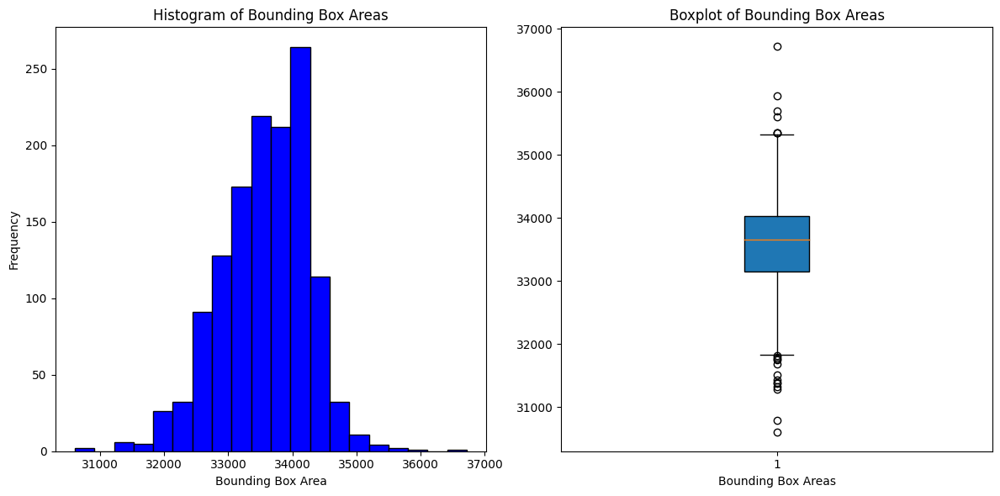

In [20]:
import matplotlib.pyplot as plt
from ultralytics import YOLO

# 모델 로드
image_dir = glob(r'C:\Users\ghkdr\Desktop\성현폴더\충북대\논문\데이터\크기편차검증용\data\대\*.jpg')
model_dir = r'C:\Users\ghkdr\Desktop\성현폴더\충북대\논문\실험\runs\yolov9c_aug\train2\weights\best.pt'

save_dir = f"result/output{len(glob('result/*'))}"
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

# 이미지 예측
model = YOLO(model_dir)
roi = box(5, 5, 950,955)
areas = []

for image_path in image_dir:
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image_to_save = image.copy()
    cv2.rectangle(image_to_save, (5, 5), (950, 955), (255, 255, 255), 3)
    
    results = model(image, conf=0.8, iou=0.6, verbose=False, save=False)

    for result in results:
        for i, (x, y, w, h) in enumerate(result.boxes.xywh.cpu().numpy()):
            # 좌표를 정수로 변환
            x, y, w, h = map(int, [x, y, w, h])
            bbox = box(x - w / 2, y - h / 2, x + w / 2, y + h / 2)

            if roi.contains(bbox):
    
                # 가로세로 비율 계산
                aspect_ratio_max = max(w / h, h / w)
                   
                # 비율에 따라 이미지를 리스트에 추가
                if aspect_ratio_max <= 1.2:
                    area = w * h
                    areas.append(area)
                
                    # xywh를 xyxy로 변환
                    x1, y1 = x - w // 2, y - h // 2
                    x2, y2 = x1 + w, y1 + h
    
                    cv2.rectangle(image_to_save, (x1, y1), (x2, y2), (255, 0, 0), 2)
                    
                    file_name = image_path.split('\\')[-1]
                    cv2.imwrite(f"{save_dir}/result_{file_name}", image_to_save)
            
                    # # 이미지 크롭
                    # cropped_image = image_rgb[y1:y2, x1:x2]
            
                    # # 가우시안 블러 적용
                    # blurred_image = cv2.GaussianBlur(cropped_image, (11, 11), 0)
                
                    # # 히스토그램 평탄화 적용
                    # cropped_image_gray = cv2.cvtColor(blurred_image, cv2.COLOR_RGB2GRAY)
                    # equalized_image = cv2.equalizeHist(cropped_image_gray)
                    
                    # # 엣지 검출
                    # edges = cv2.Canny(equalized_image, 50, 150)
        
                    # # 허프 서클 탐지
                    # circles = cv2.HoughCircles(edges, cv2.HOUGH_GRADIENT, dp=1.2, minDist=30, param1=190, param2=90, minRadius=20, maxRadius=500)
        
                    # # 원이 검출되었을 때
                    # if circles is not None:
                    #     circles = np.round(circles[0, :]).astype('int')
                    #     largest_circle = max(circles, key=lambda c: c[2])
                    #     circle_x, circle_y, radius = largest_circle
        
                    #     # 원의 지름이 width의 80% 이상인지 검사
                    #     if radius * 2 >= 0.8 * w:
                    #         # 원의 중심점과 bbox의 중심점 간의 거리 계산
                    #         distance = np.sqrt((circle_x - x) ** 2 + (circle_y - y) ** 2)
        
                    #         # 거리 조건이 30 미만일 때 면적 추가
                    #         if distance < 30:
                    #             area = w * h
                    #             areas.append(area)

# 히스토그램과 박스플롯 출력
plt.figure(figsize=(12, 6))

# 왼쪽: 히스토그램
plt.subplot(1, 2, 1)
plt.hist(areas, bins=20, color='blue', edgecolor='black')
plt.xlabel('Bounding Box Area')
plt.ylabel('Frequency')
plt.title('Histogram of Bounding Box Areas')

# 오른쪽: 박스플롯
plt.subplot(1, 2, 2)
plt.boxplot(areas, patch_artist=True)
plt.xlabel('Bounding Box Areas')
plt.title('Boxplot of Bounding Box Areas')

# 그래프 출력
plt.tight_layout()
plt.show()

In [21]:
print(np.mean(areas))
print(np.std(areas))
print(np.max(areas))
print(np.min(areas))

33577.18065003779
685.9347351904347
36720
30609


In [4]:
685.9347351904347 / 33577.18065003779

0.020428598289405894

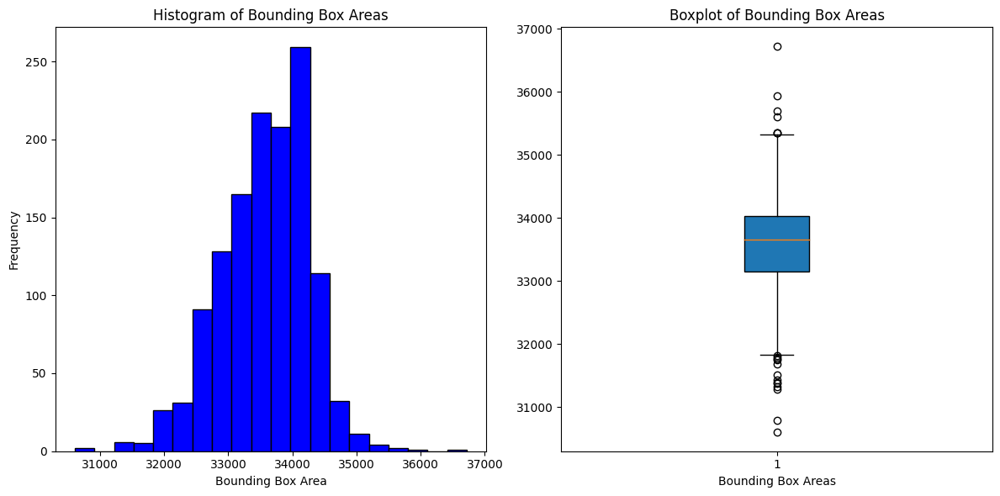

In [22]:
import matplotlib.pyplot as plt
from ultralytics import YOLO

# 모델 로드
image_dir = glob(r'C:\Users\ghkdr\Desktop\성현폴더\충북대\논문\데이터\크기편차검증용\data\대\*.jpg')
model_dir = r'C:\Users\ghkdr\Desktop\성현폴더\충북대\논문\실험\runs\yolov9c_aug\train2\weights\best.pt'

save_dir = f"result/output{len(glob('result/*'))}"
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

# 이미지 예측
model = YOLO(model_dir)
roi = box(5, 5, 950,955)
areas = []

for image_path in image_dir:
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image.copy(), cv2.COLOR_BGR2RGB)
    image_to_save = image.copy()
    cv2.rectangle(image_to_save, (5, 5), (950, 955), (255, 255, 255), 3)
    
    results = model(image, conf=0.8, iou=0.6, verbose=False, save=False)

    for result in results:
        for i, (x, y, w, h) in enumerate(result.boxes.xywh.cpu().numpy()):
            # 좌표를 정수로 변환
            x, y, w, h = map(int, [x, y, w, h])
            bbox = box(x - w / 2, y - h / 2, x + w / 2, y + h / 2)

            if roi.contains(bbox):
    
                # 가로세로 비율 계산
                aspect_ratio_max = max(w / h, h / w)
                   
                # 비율에 따라 이미지를 리스트에 추가
                if  1.0 <=aspect_ratio_max <= 1.2:
                    # area = w * h
                    # areas.append(area)
                
                    # xywh를 xyxy로 변환
                    x1, y1 = x - w // 2, y - h // 2
                    x2, y2 = x1 + w, y1 + h

                    resize_factor = int(min((x2 - x1) , (y2 - y1)))
                    # scale_factor = int(max((x2 - x1) , (y2 - y1))) / resize_factor
                      
                    # 이미지 크롭
                    cropped_image = image_rgb[y1:y2, x1:x2].copy()
                    # cropped_image = cv2.resize(cropped_image, (resize_factor, resize_factor))
            
                    # 가우시안 블러 적용
                    blurred_image = cv2.GaussianBlur(cropped_image, (11, 11), 0)
                
                    # 히스토그램 평탄화 적용
                    cropped_image_gray = cv2.cvtColor(blurred_image, cv2.COLOR_RGB2GRAY)
                    equalized_image = cv2.equalizeHist(cropped_image_gray)
                    
                    # 엣지 검출
                    edges = cv2.Canny(equalized_image, 50, 150)
        
                    # 허프 서클 탐지
                    circles = cv2.HoughCircles(edges, cv2.HOUGH_GRADIENT, dp=1.2, minDist=10, param1=190, param2=70, minRadius=5, maxRadius=500)
        
                    # 원이 검출되었을 때
                    if circles is not None:
                        area = w * h
                        areas.append(area)
                        # circles = np.round(circles[0, :]).astype('int')
                        # bbox_area = w * h
                        # bbox_radius = int(min((x2 - x1) , (y2 - y1)))
                        # bbox_area = np.pi * ((resize_factor / 2) ** 2)
                        # closest_circle = min(circles, key=lambda c: abs(np.pi * (c[2] ** 2) - bbox_area))
                        # circle_x, circle_y, radius = closest_circle

                                # 반지름 보정
                        # if resize_factor == w:|
                        #     scale_factor = h / resize_factor
                        # else:
                        #     scale_factor = w / resize_factor
                        # radius = int(radius * scale_factor)
                        
                        # cv2.circle(image_to_save, (x, y), radius, (0, 255, 0), 2)
                        # cv2.circle(image_to_save, (x, y), 3, (0, 0, 255), -1)

                        # area = np.pi * (radius ** 2)
                        # areas.append(area)
                        file_name = image_path.split('\\')[-1]
                        cv2.imwrite(f"{save_dir}/result_{file_name}", image_to_save)
        
                        # # 원의 지름이 width의 80% 이상인지 검사
                        # if radius * 2 >= 0.8 * w:
                        #     # 원의 중심점과 bbox의 중심점 간의 거리 계산
                        #     distance = np.sqrt((circle_x - x) ** 2 + (circle_y - y) ** 2)
        
                        #     # 거리 조건이 30 미만일 때 면적 추가
                        # if distance < 100:
                            

# 히스토그램과 박스플롯 출력
plt.figure(figsize=(12, 6))

# 왼쪽: 히스토그램
plt.subplot(1, 2, 1)
plt.hist(areas, bins=20, color='blue', edgecolor='black')
plt.xlabel('Bounding Box Area')
plt.ylabel('Frequency')
plt.title('Histogram of Bounding Box Areas')

# 오른쪽: 박스플롯
plt.subplot(1, 2, 2)
plt.boxplot(areas, patch_artist=True)
plt.xlabel('Bounding Box Areas')
plt.title('Boxplot of Bounding Box Areas')

# 그래프 출력
plt.tight_layout()
plt.show()

In [23]:
print(np.mean(areas))
print(np.std(areas))
print(np.max(areas))
print(np.min(areas))

33577.46354566385
688.7333318999501
36720
30609


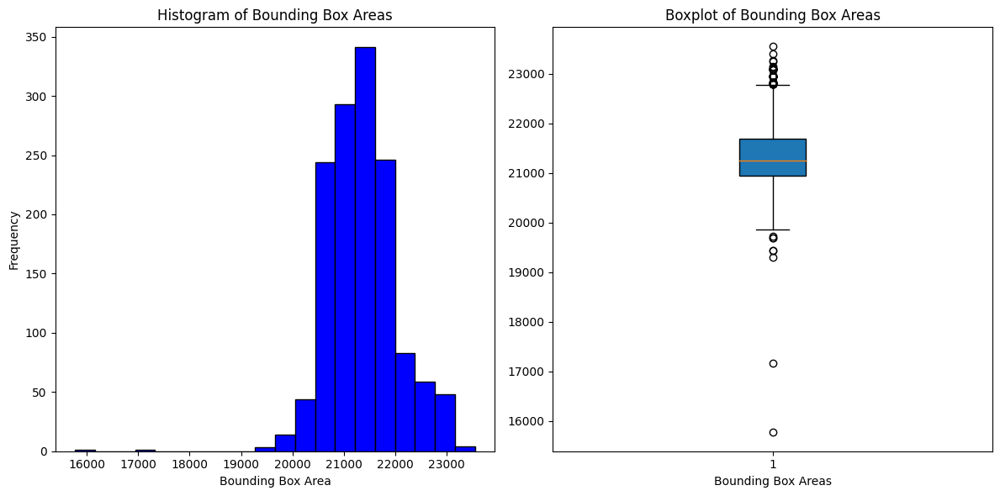

In [24]:
import matplotlib.pyplot as plt
from ultralytics import YOLO

# 모델 로드
image_dir = glob(r'C:\Users\ghkdr\Desktop\성현폴더\충북대\논문\데이터\크기편차검증용\data\중\*.jpg')
model_dir = r'C:\Users\ghkdr\Desktop\성현폴더\충북대\논문\실험\runs\yolov9c_aug\train2\weights\best.pt'

save_dir = f"result/output{len(glob('result/*'))}"
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

# 이미지 예측
model = YOLO(model_dir)
roi = box(5, 5, 950,955)
areas = []

for image_path in image_dir:
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image_to_save = image.copy()
    cv2.rectangle(image_to_save, (5, 5), (950, 955), (255, 255, 255), 3)
    
    results = model(image, conf=0.8, iou=0.6, verbose=False, save=False)

    for result in results:
        for i, (x, y, w, h) in enumerate(result.boxes.xywh.cpu().numpy()):
            # 좌표를 정수로 변환
            x, y, w, h = map(int, [x, y, w, h])
            bbox = box(x - w / 2, y - h / 2, x + w / 2, y + h / 2)

            if roi.contains(bbox):
    
                # 가로세로 비율 계산
                aspect_ratio_max = max(w / h, h / w)
                   
                # 비율에 따라 이미지를 리스트에 추가
                if aspect_ratio_max <= 1.2:
                    area = w * h
                    areas.append(area)
                
                    # xywh를 xyxy로 변환
                    x1, y1 = x - w // 2, y - h // 2
                    x2, y2 = x1 + w, y1 + h
    
                    cv2.rectangle(image_to_save, (x1, y1), (x2, y2), (255, 0, 0), 2)
                    
                    file_name = image_path.split('\\')[-1]
                    cv2.imwrite(f"{save_dir}/result_{file_name}", image_to_save)
            
                    # # 이미지 크롭
                    # cropped_image = image_rgb[y1:y2, x1:x2]
            
                    # # 가우시안 블러 적용
                    # blurred_image = cv2.GaussianBlur(cropped_image, (11, 11), 0)
                
                    # # 히스토그램 평탄화 적용
                    # cropped_image_gray = cv2.cvtColor(blurred_image, cv2.COLOR_RGB2GRAY)
                    # equalized_image = cv2.equalizeHist(cropped_image_gray)
                    
                    # # 엣지 검출
                    # edges = cv2.Canny(equalized_image, 50, 150)
        
                    # # 허프 서클 탐지
                    # circles = cv2.HoughCircles(edges, cv2.HOUGH_GRADIENT, dp=1.2, minDist=30, param1=190, param2=90, minRadius=20, maxRadius=500)
        
                    # # 원이 검출되었을 때
                    # if circles is not None:
                    #     circles = np.round(circles[0, :]).astype('int')
                    #     largest_circle = max(circles, key=lambda c: c[2])
                    #     circle_x, circle_y, radius = largest_circle
        
                    #     # 원의 지름이 width의 80% 이상인지 검사
                    #     if radius * 2 >= 0.8 * w:
                    #         # 원의 중심점과 bbox의 중심점 간의 거리 계산
                    #         distance = np.sqrt((circle_x - x) ** 2 + (circle_y - y) ** 2)
        
                    #         # 거리 조건이 30 미만일 때 면적 추가
                    #         if distance < 30:
                    #             area = w * h
                    #             areas.append(area)

# 히스토그램과 박스플롯 출력
plt.figure(figsize=(12, 6))

# 왼쪽: 히스토그램
plt.subplot(1, 2, 1)
plt.hist(areas, bins=20, color='blue', edgecolor='black')
plt.xlabel('Bounding Box Area')
plt.ylabel('Frequency')
plt.title('Histogram of Bounding Box Areas')

# 오른쪽: 박스플롯
plt.subplot(1, 2, 2)
plt.boxplot(areas, patch_artist=True)
plt.xlabel('Bounding Box Areas')
plt.title('Boxplot of Bounding Box Areas')

# 그래프 출력
plt.tight_layout()
plt.show()

In [25]:
print(np.mean(areas))
print(np.std(areas))
print(np.max(areas))
print(np.min(areas))

21354.74511223751
667.3358567835992
23547
15776


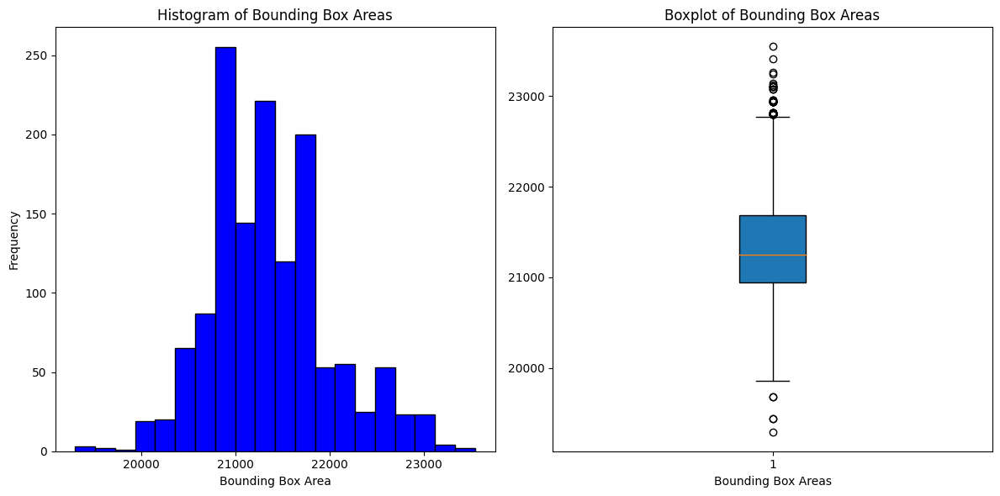

In [26]:
import matplotlib.pyplot as plt
from ultralytics import YOLO

# 모델 로드
image_dir = glob(r'C:\Users\ghkdr\Desktop\성현폴더\충북대\논문\데이터\크기편차검증용\data\중\*.jpg')
model_dir = r'C:\Users\ghkdr\Desktop\성현폴더\충북대\논문\실험\runs\yolov9c_aug\train2\weights\best.pt'

save_dir = f"result/output{len(glob('result/*'))}"
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

# 이미지 예측
model = YOLO(model_dir)
roi = box(5, 5, 950,955)
areas = []

for image_path in image_dir:
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image.copy(), cv2.COLOR_BGR2RGB)
    image_to_save = image.copy()
    cv2.rectangle(image_to_save, (5, 5), (950, 955), (255, 255, 255), 3)
    
    results = model(image, conf=0.8, iou=0.6, verbose=False, save=False)

    for result in results:
        for i, (x, y, w, h) in enumerate(result.boxes.xywh.cpu().numpy()):
            # 좌표를 정수로 변환
            x, y, w, h = map(int, [x, y, w, h])
            bbox = box(x - w / 2, y - h / 2, x + w / 2, y + h / 2)

            if roi.contains(bbox):
    
                # 가로세로 비율 계산
                aspect_ratio_max = max(w / h, h / w)
                   
                # 비율에 따라 이미지를 리스트에 추가
                if  1.0 <=aspect_ratio_max <= 1.2:
                    # area = w * h
                    # areas.append(area)
                
                    # xywh를 xyxy로 변환
                    x1, y1 = x - w // 2, y - h // 2
                    x2, y2 = x1 + w, y1 + h

                    resize_factor = int(min((x2 - x1) , (y2 - y1)))
                    # scale_factor = int(max((x2 - x1) , (y2 - y1))) / resize_factor
                      
                    # 이미지 크롭
                    cropped_image = image_rgb[y1:y2, x1:x2].copy()
                    # cropped_image = cv2.resize(cropped_image, (resize_factor, resize_factor))
            
                    # 가우시안 블러 적용
                    blurred_image = cv2.GaussianBlur(cropped_image, (11, 11), 0)
                
                    # 히스토그램 평탄화 적용
                    cropped_image_gray = cv2.cvtColor(blurred_image, cv2.COLOR_RGB2GRAY)
                    equalized_image = cv2.equalizeHist(cropped_image_gray)
                    
                    # 엣지 검출
                    edges = cv2.Canny(equalized_image, 50, 150)
        
                    # 허프 서클 탐지
                    circles = cv2.HoughCircles(edges, cv2.HOUGH_GRADIENT, dp=1.2, minDist=10, param1=190, param2=70, minRadius=5, maxRadius=500)
        
                    # 원이 검출되었을 때
                    if circles is not None:
                        area = w * h
                        areas.append(area)
                        # circles = np.round(circles[0, :]).astype('int')
                        # bbox_area = w * h
                        # bbox_radius = int(min((x2 - x1) , (y2 - y1)))
                        # bbox_area = np.pi * ((resize_factor / 2) ** 2)
                        # closest_circle = min(circles, key=lambda c: abs(np.pi * (c[2] ** 2) - bbox_area))
                        # circle_x, circle_y, radius = closest_circle

                                # 반지름 보정
                        # if resize_factor == w:|
                        #     scale_factor = h / resize_factor
                        # else:
                        #     scale_factor = w / resize_factor
                        # radius = int(radius * scale_factor)
                        
                        # cv2.circle(image_to_save, (x, y), radius, (0, 255, 0), 2)
                        # cv2.circle(image_to_save, (x, y), 3, (0, 0, 255), -1)

                        # area = np.pi * (radius ** 2)
                        # areas.append(area)
                        file_name = image_path.split('\\')[-1]
                        cv2.imwrite(f"{save_dir}/result_{file_name}", image_to_save)
        
                        # # 원의 지름이 width의 80% 이상인지 검사
                        # if radius * 2 >= 0.8 * w:
                        #     # 원의 중심점과 bbox의 중심점 간의 거리 계산
                        #     distance = np.sqrt((circle_x - x) ** 2 + (circle_y - y) ** 2)
        
                        #     # 거리 조건이 30 미만일 때 면적 추가
                        # if distance < 100:
                            

# 히스토그램과 박스플롯 출력
plt.figure(figsize=(12, 6))

# 왼쪽: 히스토그램
plt.subplot(1, 2, 1)
plt.hist(areas, bins=20, color='blue', edgecolor='black')
plt.xlabel('Bounding Box Area')
plt.ylabel('Frequency')
plt.title('Histogram of Bounding Box Areas')

# 오른쪽: 박스플롯
plt.subplot(1, 2, 2)
plt.boxplot(areas, patch_artist=True)
plt.xlabel('Bounding Box Areas')
plt.title('Boxplot of Bounding Box Areas')

# 그래프 출력
plt.tight_layout()
plt.show()

In [27]:
print(np.mean(areas))
print(np.std(areas))
print(np.max(areas))
print(np.min(areas))

21361.576
638.7557574523656
23547
19296


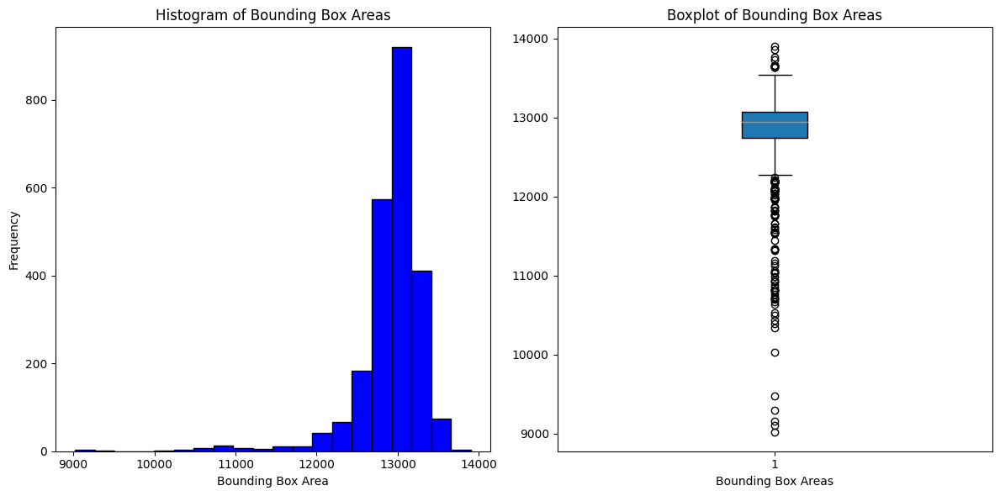

In [28]:
import matplotlib.pyplot as plt
from ultralytics import YOLO

# 모델 로드
image_dir = glob(r'C:\Users\ghkdr\Desktop\성현폴더\충북대\논문\데이터\크기편차검증용\data\소\*.jpg')
model_dir = r'C:\Users\ghkdr\Desktop\성현폴더\충북대\논문\실험\runs\yolov9c_aug\train2\weights\best.pt'

save_dir = f"result/output{len(glob('result/*'))}"
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

# 이미지 예측
model = YOLO(model_dir)
roi = box(5, 5, 950,955)
areas = []

for image_path in image_dir:
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image_to_save = image.copy()
    cv2.rectangle(image_to_save, (5, 5), (950, 955), (255, 255, 255), 3)
    
    results = model(image, conf=0.8, iou=0.6, verbose=False, save=False)

    for result in results:
        for i, (x, y, w, h) in enumerate(result.boxes.xywh.cpu().numpy()):
            # 좌표를 정수로 변환
            x, y, w, h = map(int, [x, y, w, h])
            bbox = box(x - w / 2, y - h / 2, x + w / 2, y + h / 2)

            if roi.contains(bbox):
    
                # 가로세로 비율 계산
                aspect_ratio_max = max(w / h, h / w)
                   
                # 비율에 따라 이미지를 리스트에 추가
                if aspect_ratio_max <= 1.2:
                    area = w * h
                    areas.append(area)
                
                    # xywh를 xyxy로 변환
                    x1, y1 = x - w // 2, y - h // 2
                    x2, y2 = x1 + w, y1 + h
    
                    cv2.rectangle(image_to_save, (x1, y1), (x2, y2), (255, 0, 0), 2)
                    
                    file_name = image_path.split('\\')[-1]
                    cv2.imwrite(f"{save_dir}/result_{file_name}", image_to_save)
            
                    # # 이미지 크롭
                    # cropped_image = image_rgb[y1:y2, x1:x2]
            
                    # # 가우시안 블러 적용
                    # blurred_image = cv2.GaussianBlur(cropped_image, (11, 11), 0)
                
                    # # 히스토그램 평탄화 적용
                    # cropped_image_gray = cv2.cvtColor(blurred_image, cv2.COLOR_RGB2GRAY)
                    # equalized_image = cv2.equalizeHist(cropped_image_gray)
                    
                    # # 엣지 검출
                    # edges = cv2.Canny(equalized_image, 50, 150)
        
                    # # 허프 서클 탐지
                    # circles = cv2.HoughCircles(edges, cv2.HOUGH_GRADIENT, dp=1.2, minDist=30, param1=190, param2=90, minRadius=20, maxRadius=500)
        
                    # # 원이 검출되었을 때
                    # if circles is not None:
                    #     circles = np.round(circles[0, :]).astype('int')
                    #     largest_circle = max(circles, key=lambda c: c[2])
                    #     circle_x, circle_y, radius = largest_circle
        
                    #     # 원의 지름이 width의 80% 이상인지 검사
                    #     if radius * 2 >= 0.8 * w:
                    #         # 원의 중심점과 bbox의 중심점 간의 거리 계산
                    #         distance = np.sqrt((circle_x - x) ** 2 + (circle_y - y) ** 2)
        
                    #         # 거리 조건이 30 미만일 때 면적 추가
                    #         if distance < 30:
                    #             area = w * h
                    #             areas.append(area)

# 히스토그램과 박스플롯 출력
plt.figure(figsize=(12, 6))

# 왼쪽: 히스토그램
plt.subplot(1, 2, 1)
plt.hist(areas, bins=20, color='blue', edgecolor='black')
plt.xlabel('Bounding Box Area')
plt.ylabel('Frequency')
plt.title('Histogram of Bounding Box Areas')

# 오른쪽: 박스플롯
plt.subplot(1, 2, 2)
plt.boxplot(areas, patch_artist=True)
plt.xlabel('Bounding Box Areas')
plt.title('Boxplot of Bounding Box Areas')

# 그래프 출력
plt.tight_layout()
plt.show()

In [29]:
print(np.mean(areas))
print(np.std(areas))
print(np.max(areas))
print(np.min(areas))

12890.130565068494
426.30373219041286
13899
9021


In [44]:
426.30373219041286 / 12890.130565068494

0.03307210350108255

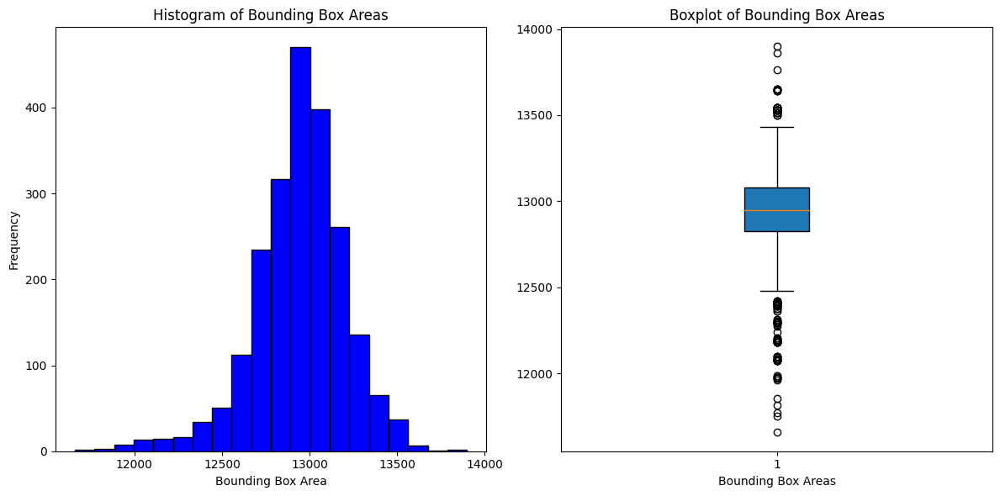

In [30]:
import matplotlib.pyplot as plt
from ultralytics import YOLO

# 모델 로드
image_dir = glob(r'C:\Users\ghkdr\Desktop\성현폴더\충북대\논문\데이터\크기편차검증용\data\소\*.jpg')
model_dir = r'C:\Users\ghkdr\Desktop\성현폴더\충북대\논문\실험\runs\yolov9c_aug\train2\weights\best.pt'

save_dir = f"result/output{len(glob('result/*'))}"
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

# 이미지 예측
model = YOLO(model_dir)
roi = box(5, 5, 950,955)
areas = []

for image_path in image_dir:
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image.copy(), cv2.COLOR_BGR2RGB)
    image_to_save = image.copy()
    cv2.rectangle(image_to_save, (5, 5), (950, 955), (255, 255, 255), 3)
    
    results = model(image, conf=0.8, iou=0.6, verbose=False, save=False)

    for result in results:
        for i, (x, y, w, h) in enumerate(result.boxes.xywh.cpu().numpy()):
            # 좌표를 정수로 변환
            x, y, w, h = map(int, [x, y, w, h])
            bbox = box(x - w / 2, y - h / 2, x + w / 2, y + h / 2)

            if roi.contains(bbox):
    
                # 가로세로 비율 계산
                aspect_ratio_max = max(w / h, h / w)
                   
                # 비율에 따라 이미지를 리스트에 추가
                if  1.0 <=aspect_ratio_max <= 1.2:
                    # area = w * h
                    # areas.append(area)
                
                    # xywh를 xyxy로 변환
                    x1, y1 = x - w // 2, y - h // 2
                    x2, y2 = x1 + w, y1 + h

                    resize_factor = int(min((x2 - x1) , (y2 - y1)))
                    # scale_factor = int(max((x2 - x1) , (y2 - y1))) / resize_factor
                      
                    # 이미지 크롭
                    cropped_image = image_rgb[y1:y2, x1:x2].copy()
                    # cropped_image = cv2.resize(cropped_image, (resize_factor, resize_factor))
            
                    # 가우시안 블러 적용
                    blurred_image = cv2.GaussianBlur(cropped_image, (11, 11), 0)
                
                    # 히스토그램 평탄화 적용
                    cropped_image_gray = cv2.cvtColor(blurred_image, cv2.COLOR_RGB2GRAY)
                    equalized_image = cv2.equalizeHist(cropped_image_gray)
                    
                    # 엣지 검출
                    edges = cv2.Canny(equalized_image, 50, 150)
        
                    # 허프 서클 탐지
                    circles = cv2.HoughCircles(edges, cv2.HOUGH_GRADIENT, dp=1.2, minDist=10, param1=190, param2=70, minRadius=5, maxRadius=500)
        
                    # 원이 검출되었을 때
                    if circles is not None:
                        area = w * h
                        areas.append(area)
                        # circles = np.round(circles[0, :]).astype('int')
                        # bbox_area = w * h
                        # bbox_radius = int(min((x2 - x1) , (y2 - y1)))
                        # bbox_area = np.pi * ((resize_factor / 2) ** 2)
                        # closest_circle = min(circles, key=lambda c: abs(np.pi * (c[2] ** 2) - bbox_area))
                        # circle_x, circle_y, radius = closest_circle

                                # 반지름 보정
                        # if resize_factor == w:|
                        #     scale_factor = h / resize_factor
                        # else:
                        #     scale_factor = w / resize_factor
                        # radius = int(radius * scale_factor)
                        
                        # cv2.circle(image_to_save, (x, y), radius, (0, 255, 0), 2)
                        # cv2.circle(image_to_save, (x, y), 3, (0, 0, 255), -1)

                        # area = np.pi * (radius ** 2)
                        # areas.append(area)
                        file_name = image_path.split('\\')[-1]
                        cv2.imwrite(f"{save_dir}/result_{file_name}", image_to_save)
        
                        # # 원의 지름이 width의 80% 이상인지 검사
                        # if radius * 2 >= 0.8 * w:
                        #     # 원의 중심점과 bbox의 중심점 간의 거리 계산
                        #     distance = np.sqrt((circle_x - x) ** 2 + (circle_y - y) ** 2)
        
                        #     # 거리 조건이 30 미만일 때 면적 추가
                        # if distance < 100:
                            

# 히스토그램과 박스플롯 출력
plt.figure(figsize=(12, 6))

# 왼쪽: 히스토그램
plt.subplot(1, 2, 1)
plt.hist(areas, bins=20, color='blue', edgecolor='black')
plt.xlabel('Bounding Box Area')
plt.ylabel('Frequency')
plt.title('Histogram of Bounding Box Areas')

# 오른쪽: 박스플롯
plt.subplot(1, 2, 2)
plt.boxplot(areas, patch_artist=True)
plt.xlabel('Bounding Box Areas')
plt.title('Boxplot of Bounding Box Areas')

# 그래프 출력
plt.tight_layout()
plt.show()

In [31]:
print(np.mean(areas))
print(np.std(areas))
print(np.max(areas))
print(np.min(areas))

12948.970210815765
266.2970876532878
13899
11660


In [45]:
266.2970876532878 / 12948.970210815765

0.02056511701840663

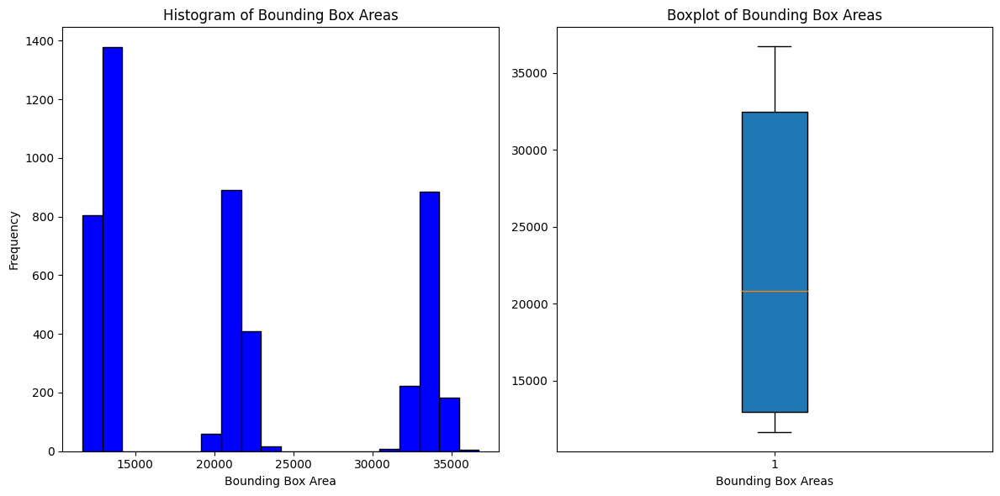

In [42]:
import matplotlib.pyplot as plt
from ultralytics import YOLO

# 모델 로드
image_dir = glob(r'C:\Users\ghkdr\Desktop\성현폴더\충북대\논문\데이터\크기편차검증용\data\*\*.jpg')
model_dir = r'C:\Users\ghkdr\Desktop\성현폴더\충북대\논문\실험\runs\yolov9c_aug\train2\weights\best.pt'

save_dir = f"result/output{len(glob('result/*'))}"
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

# 이미지 예측
model = YOLO(model_dir)
roi = box(5, 5, 950,955)
areas = []

for image_path in image_dir:
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image.copy(), cv2.COLOR_BGR2RGB)
    image_to_save = image.copy()
    cv2.rectangle(image_to_save, (5, 5), (950, 955), (255, 255, 255), 3)
    
    results = model(image, conf=0.8, iou=0.6, verbose=False, save=False)

    for result in results:
        for i, (x, y, w, h) in enumerate(result.boxes.xywh.cpu().numpy()):
            # 좌표를 정수로 변환
            x, y, w, h = map(int, [x, y, w, h])
            bbox = box(x - w / 2, y - h / 2, x + w / 2, y + h / 2)

            if roi.contains(bbox):
    
                # 가로세로 비율 계산
                aspect_ratio_max = max(w / h, h / w)
                   
                # 비율에 따라 이미지를 리스트에 추가
                if  1.0 <=aspect_ratio_max <= 1.2:
                    # area = w * h
                    # areas.append(area)
                
                    # xywh를 xyxy로 변환
                    x1, y1 = x - w // 2, y - h // 2
                    x2, y2 = x1 + w, y1 + h

                    resize_factor = int(min((x2 - x1) , (y2 - y1)))
                    # scale_factor = int(max((x2 - x1) , (y2 - y1))) / resize_factor
                      
                    # 이미지 크롭
                    cropped_image = image_rgb[y1:y2, x1:x2].copy()
                    # cropped_image = cv2.resize(cropped_image, (resize_factor, resize_factor))
            
                    # 가우시안 블러 적용
                    blurred_image = cv2.GaussianBlur(cropped_image, (11, 11), 0)
                
                    # 히스토그램 평탄화 적용
                    cropped_image_gray = cv2.cvtColor(blurred_image, cv2.COLOR_RGB2GRAY)
                    equalized_image = cv2.equalizeHist(cropped_image_gray)
                    
                    # 엣지 검출
                    edges = cv2.Canny(equalized_image, 50, 150)
        
                    # 허프 서클 탐지
                    circles = cv2.HoughCircles(edges, cv2.HOUGH_GRADIENT, dp=1.2, minDist=10, param1=190, param2=70, minRadius=5, maxRadius=500)
        
                    # 원이 검출되었을 때
                    if circles is not None:
                        area = w * h
                        areas.append(area)
                        # circles = np.round(circles[0, :]).astype('int')
                        # bbox_area = w * h
                        # bbox_radius = int(min((x2 - x1) , (y2 - y1)))
                        # bbox_area = np.pi * ((resize_factor / 2) ** 2)
                        # closest_circle = min(circles, key=lambda c: abs(np.pi * (c[2] ** 2) - bbox_area))
                        # circle_x, circle_y, radius = closest_circle

                                # 반지름 보정
                        # if resize_factor == w:|
                        #     scale_factor = h / resize_factor
                        # else:
                        #     scale_factor = w / resize_factor
                        # radius = int(radius * scale_factor)
                        
                        # cv2.circle(image_to_save, (x, y), radius, (0, 255, 0), 2)
                        # cv2.circle(image_to_save, (x, y), 3, (0, 0, 255), -1)

                        # area = np.pi * (radius ** 2)
                        # areas.append(area)
                        file_name = image_path.split('\\')[-1]
                        cv2.imwrite(f"{save_dir}/result_{file_name}", image_to_save)
        
                        # # 원의 지름이 width의 80% 이상인지 검사
                        # if radius * 2 >= 0.8 * w:
                        #     # 원의 중심점과 bbox의 중심점 간의 거리 계산
                        #     distance = np.sqrt((circle_x - x) ** 2 + (circle_y - y) ** 2)
        
                        #     # 거리 조건이 30 미만일 때 면적 추가
                        # if distance < 100:
                            

# 히스토그램과 박스플롯 출력
plt.figure(figsize=(12, 6))

# 왼쪽: 히스토그램
plt.subplot(1, 2, 1)
plt.hist(areas, bins=20, color='blue', edgecolor='black')
plt.xlabel('Bounding Box Area')
plt.ylabel('Frequency')
plt.title('Histogram of Bounding Box Areas')

# 오른쪽: 박스플롯
plt.subplot(1, 2, 2)
plt.boxplot(areas, patch_artist=True)
plt.xlabel('Bounding Box Areas')
plt.title('Boxplot of Bounding Box Areas')

# 그래프 출력
plt.tight_layout()
plt.show()

In [ ]:
import matplotlib.pyplot as plt
from ultralytics import YOLO
import time

# 모델 로드
image_dir = glob(r'C:\Users\ghkdr\Desktop\성현폴더\충북대\논문\데이터\크기편차검증용\data\*\*.jpg')
model_dir = r'C:\Users\ghkdr\Desktop\성현폴더\충북대\논문\실험\runs\yolov9c_aug\train2\weights\best.pt'

save_dir = f"result/output{len(glob('result/*'))}"
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

# 이미지 예측
model = YOLO(model_dir)
roi = box(5, 5, 950,955)
areas = []

for image_path in image_dir:
    start = time.time()
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image.copy(), cv2.COLOR_BGR2RGB)
    image_to_save = image.copy()
    cv2.rectangle(image_to_save, (5, 5), (950, 955), (255, 255, 255), 3)
    
    results = model(image, conf=0.6, iou=0.6, verbose=False, save=False)

    for result in results:
        for i, (x, y, w, h) in enumerate(result.boxes.xywh.cpu().numpy()):
            # 좌표를 정수로 변환
            x, y, w, h = map(int, [x, y, w, h])
            bbox = box(x - w / 2, y - h / 2, x + w / 2, y + h / 2)

            if roi.contains(bbox):
    
                # 가로세로 비율 계산
                aspect_ratio_max = max(w / h, h / w)
                   
                # 비율에 따라 이미지를 리스트에 추가
                if  1.0 <=aspect_ratio_max <= 1.2:
                    # area = w * h
                    # areas.append(area)
                
                    # xywh를 xyxy로 변환
                    x1, y1 = x - w // 2, y - h // 2
                    x2, y2 = x1 + w, y1 + h

                    resize_factor = int(min((x2 - x1) , (y2 - y1)))
                    # scale_factor = int(max((x2 - x1) , (y2 - y1))) / resize_factor
                      
                    # 이미지 크롭
                    cropped_image = image_rgb[y1:y2, x1:x2].copy()
                    # cropped_image = cv2.resize(cropped_image, (resize_factor, resize_factor))
            
                    # 가우시안 블러 적용
                    blurred_image = cv2.GaussianBlur(cropped_image, (11, 11), 0)
                
                    # 히스토그램 평탄화 적용
                    cropped_image_gray = cv2.cvtColor(blurred_image, cv2.COLOR_RGB2GRAY)
                    equalized_image = cv2.equalizeHist(cropped_image_gray)
                    
                    # 엣지 검출
                    edges = cv2.Canny(equalized_image, 50, 150)
        
                    # 허프 서클 탐지
                    circles = cv2.HoughCircles(edges, cv2.HOUGH_GRADIENT, dp=1.2, minDist=30, param1=190, param2=50, minRadius=20, maxRadius=500)
        
                    # 원이 검출되었을 때
                    if circles is not None:
                        area = w * h
                        areas.append(area)
                        print(time.time() - start)
                        # circles = np.round(circles[0, :]).astype('int')
                        # bbox_area = w * h
                        # bbox_radius = int(min((x2 - x1) , (y2 - y1)))
                        # bbox_area = np.pi * ((resize_factor / 2) ** 2)
                        # closest_circle = min(circles, key=lambda c: abs(np.pi * (c[2] ** 2) - bbox_area))
                        # circle_x, circle_y, radius = closest_circle

                                # 반지름 보정
                        # if resize_factor == w:|
                        #     scale_factor = h / resize_factor
                        # else:
                        #     scale_factor = w / resize_factor
                        # radius = int(radius * scale_factor)
                        
                        # cv2.circle(image_to_save, (x, y), radius, (0, 255, 0), 2)
                        # cv2.circle(image_to_save, (x, y), 3, (0, 0, 255), -1)

                        # area = np.pi * (radius ** 2)
                        # areas.append(area)
                        file_name = image_path.split('\\')[-1]
                        # cv2.imwrite(f"{save_dir}/result_{file_name}", image_to_save)
        
                        # # 원의 지름이 width의 80% 이상인지 검사
                        # if radius * 2 >= 0.8 * w:
                        #     # 원의 중심점과 bbox의 중심점 간의 거리 계산
                        #     distance = np.sqrt((circle_x - x) ** 2 + (circle_y - y) ** 2)
        
                        #     # 거리 조건이 30 미만일 때 면적 추가
                        # if distance < 100:
                            

# 히스토그램과 박스플롯 출력
plt.figure(figsize=(12, 6))

# 왼쪽: 히스토그램
plt.subplot(1, 2, 1)
plt.hist(areas, bins=20, color='blue', edgecolor='black')
plt.xlabel('Bounding Box Area')
plt.ylabel('Frequency')
plt.title('Histogram of Bounding Box Areas')

# 오른쪽: 박스플롯
plt.subplot(1, 2, 2)
plt.boxplot(areas, patch_artist=True)
plt.xlabel('Bounding Box Areas')
plt.title('Boxplot of Bounding Box Areas')

# 그래프 출력
plt.tight_layout()
plt.show()

2.052152633666992
2.059600591659546
2.0721232891082764
2.087639331817627
2.092839479446411
0.05117988586425781
0.057691097259521484
0.06669235229492188
0.07221508026123047
0.043531179428100586
0.052237749099731445
0.06175398826599121
0.057013750076293945
0.06352686882019043
0.07204437255859375
0.07606768608093262
0.08458852767944336
0.09510970115661621
0.09861445426940918
0.11013531684875488
0.12416243553161621
0.12967395782470703
0.14019513130187988
0.06747579574584961
0.07957696914672852
0.08968091011047363
0.07025337219238281
0.07775592803955078
0.08827018737792969
0.09179043769836426
0.06630873680114746
0.07026219367980957
0.08078837394714355
0.08928418159484863
0.04560065269470215
0.05713224411010742
0.06164288520812988
0.0716710090637207
0.07718062400817871
0.05554389953613281
0.06705284118652344
0.07056403160095215
0.0765688419342041
0.08575153350830078
0.09077811241149902
0.07015872001647949
0.07516050338745117
0.08667540550231934
0.0932159423828125
0.09731435775756836
0.101328

KeyboardInterrupt: 